In [ ]:
!nvidia-msi

/bin/bash: line 1: nvidia-msi: command not found


In [ ]:
!pip install ultralytics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 793.6/793.6 kB 12.9 MB/s eta 0:00:00
  Using cached nvidia_cuda_nvrtc_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (23.7 MB)
  Using cached nvidia_cuda_runtime_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (823 kB)
  Using cached nvidia_cuda_cupti_cu12-12.1.105-py3-none-manylinux1_x86_64.whl (14.1 MB)
  Using cached nvidia_cudnn_cu12-8.9.2.26-py3-none-manylinux1_x86_64.whl (731.7 MB)
  Using cached nvidia_cublas_cu12-12.1.3.1-py3-none-manylinux1_x86_64.whl (410.6 MB)
  Using cached nvidia_cufft_cu12-11.0.2.54-py3-none-manylinux1_x86_64.whl (121.6 MB)
  Using cached nvidia_curand_cu12-10.3.2.106-py3-none-manylinux1_x86_64.whl (56.5 MB)
  Using cached nvidia_cusolver_cu12-11.4.5.107-py3-none-manylinux1_x86_64.whl (124.2 MB)
  Using cached nvidia_cusparse_cu12-12.1.0.106-py3-none-manylinux1_x86_64.whl (196.0 MB)
  Using cached nvidia_nccl_cu12-2.20.5-py3-none-manylinux2014_x86_64.whl (176.2 MB)
  Using cached nvidia_nvtx_cu12-12.1.105-py3-none-

INSTAL YOLOV8

In [ ]:
from ultralytics import YOLO
import os
from IPython.display import display, Image
from IPython import display
display.clear_output()


Train YOLO MODEL


In [ ]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="tJLaAfUTsaNCNuYy2prh")
project = rf.workspace("cs424supermarket").project("classroomv2")
version = project.version(1)
dataset = version.download("yolov8")

loading Roboflow workspace...
loading Roboflow project...
Dependency ultralytics==8.0.196 is required but found version=8.2.45, to fix: `pip install ultralytics==8.0.196`


!yolo task=detect mode=train model=yolov8s.pt data={dataset.location}/data.yaml epochs=50 imgsz=640


In [ ]:
!yolo task=detect mode=train model=yolov8s.pt data={dataset.location}/data.yaml epochs=30 imgsz=640

100% 21.5M/21.5M [00:00<00:00, 518MB/s]
Ultralytics YOLOv8.2.45 🚀 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8s.pt, data=/content/classroomv2-1/data.yaml, epochs=30, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=None, name=train, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=

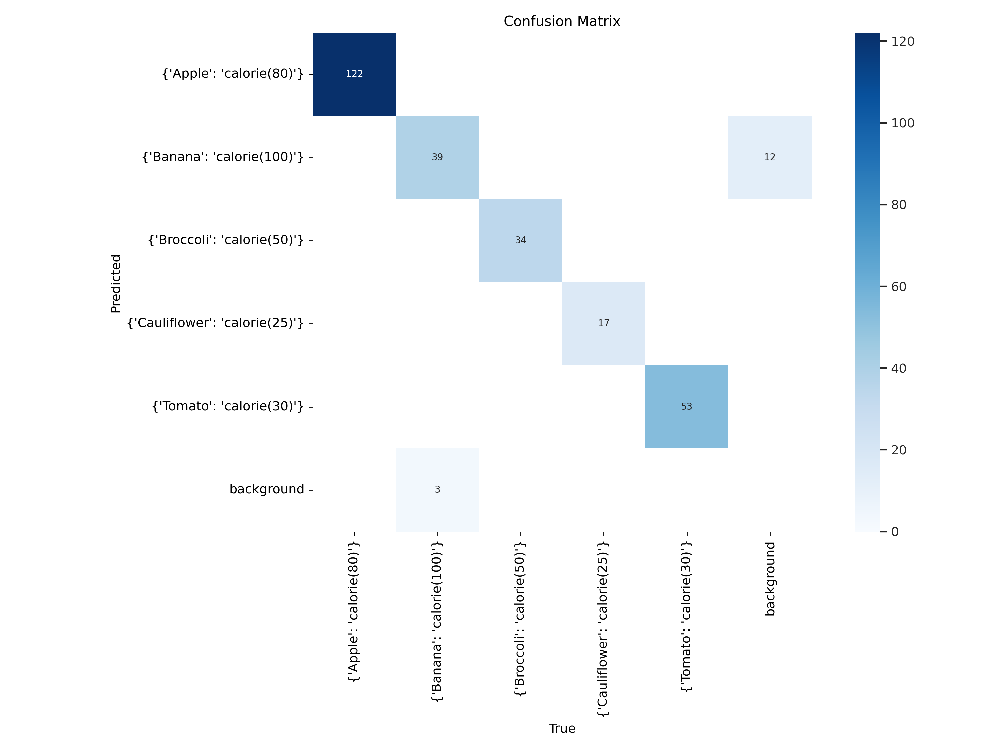

In [ ]:
Image(filename=f'/content/runs/detect/train/confusion_matrix.png', width=600)

In [ ]:
!yolo task=detect mode=val model=/content/runs/detect/train/weights/best.pt data={dataset.location}/data.yaml

Ultralytics YOLOv8.2.45 🚀 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 11127519 parameters, 0 gradients, 28.4 GFLOPs
val: Scanning /content/classroomv2-1/valid/labels.cache... 19 images, 0 backgrounds, 0 corrupt: 100% 19/19 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% 2/2 [00:03<00:00,  1.99s/it]
                   all         19        268      0.995      0.961      0.987      0.868
{'Apple': 'calorie(80)'}         17        122      0.999          1      0.995      0.878
{'Banana': 'calorie(100)'}         19         42          1      0.803      0.955      0.741
{'Broccoli': 'calorie(50)'}         17         34      0.993          1      0.995      0.943
{'Cauliflower': 'calorie(25)'}         17         17      0.985          1      0.995      0.929
{'Tomato': 'calorie(30)'}         17         53      0.997          1      0.995       0.85
Speed: 11.4ms preprocess, 42

In [ ]:
!yolo task=detect mode=predict model=/content/runs/detect/train/weights/best.pt conf=0.5 source={dataset.location}/test/images

Ultralytics YOLOv8.2.45 🚀 Python-3.10.12 torch-2.3.0+cu121 CUDA:0 (Tesla T4, 15102MiB)
Model summary (fused): 168 layers, 11127519 parameters, 0 gradients, 28.4 GFLOPs

image 1/11 /content/classroomv2-1/test/images/2022-03-29-10-55-11_jpg.rf.42f7e5461a6232bdb19532dcd2d9363e.jpg: 640x640 8 {'Apple': 'calorie(80)'}s, 2 {'Banana': 'calorie(100)'}s, 2 {'Broccoli': 'calorie(50)'}s, 1 {'Cauliflower': 'calorie(25)'}, 3 {'Tomato': 'calorie(30)'}s, 16.3ms
image 2/11 /content/classroomv2-1/test/images/20220329_103632_jpg.rf.2755c3176ad5e8c91404a38396d07adb.jpg: 640x640 6 {'Apple': 'calorie(80)'}s, 2 {'Banana': 'calorie(100)'}s, 2 {'Broccoli': 'calorie(50)'}s, 1 {'Cauliflower': 'calorie(25)'}, 3 {'Tomato': 'calorie(30)'}s, 16.3ms
image 3/11 /content/classroomv2-1/test/images/20220329_103641_jpg.rf.d5c956b354a8ecae655b508d73f280c6.jpg: 640x640 6 {'Apple': 'calorie(80)'}s, 2 {'Banana': 'calorie(100)'}s, 2 {'Broccoli': 'calorie(50)'}s, 1 {'Cauliflower': 'calorie(25)'}, 3 {'Tomato': 'calorie(30)'}s, 

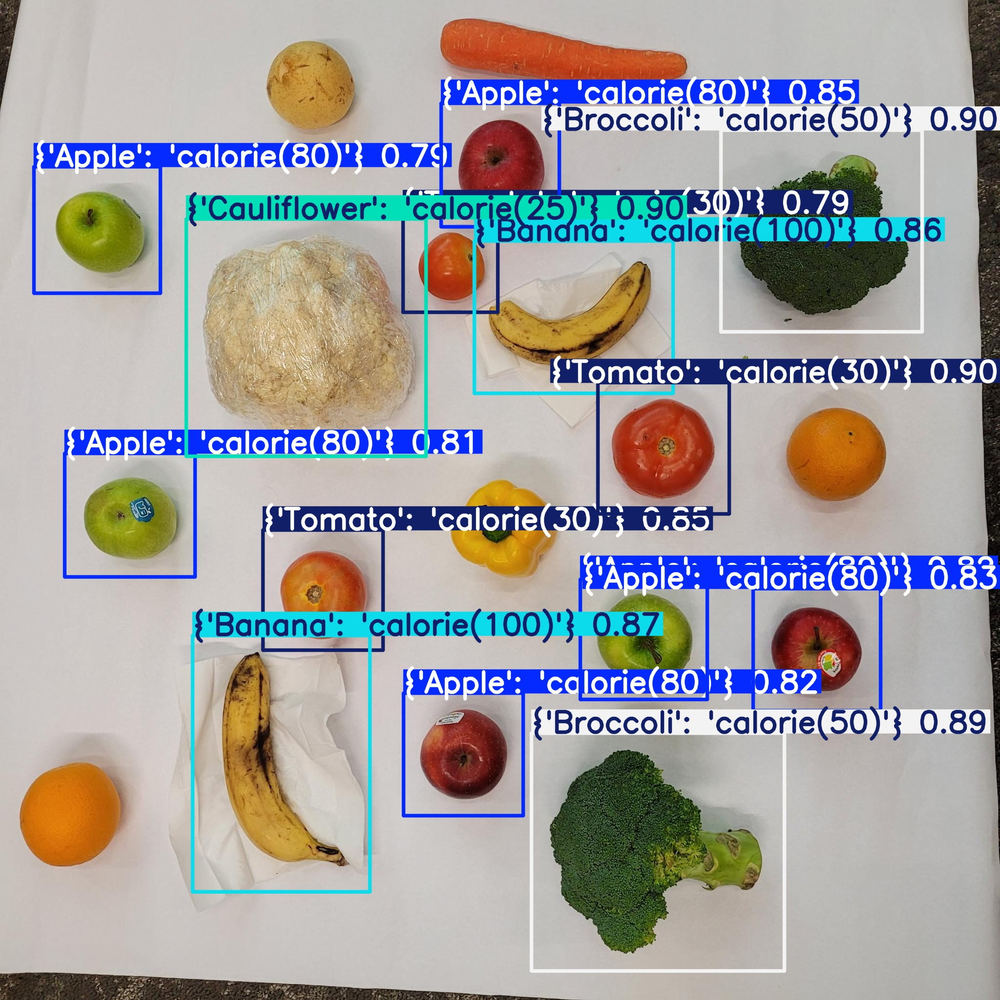

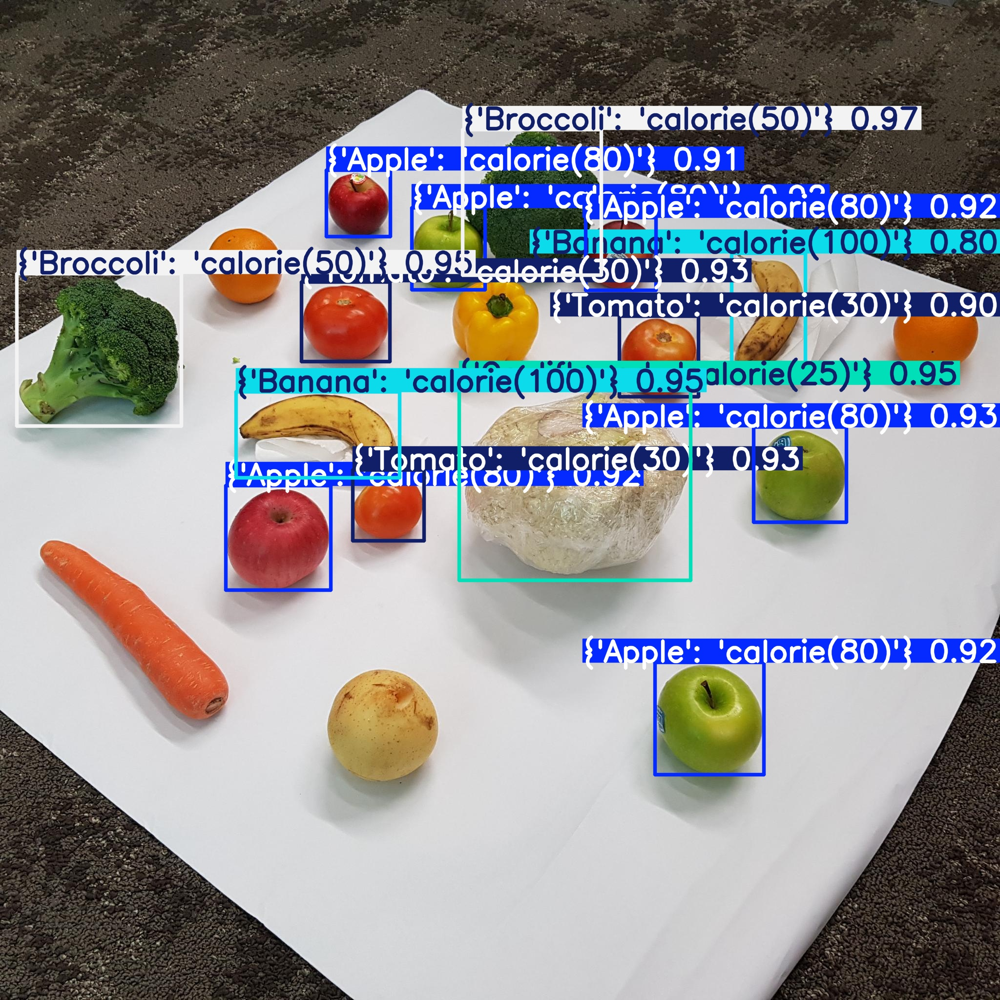

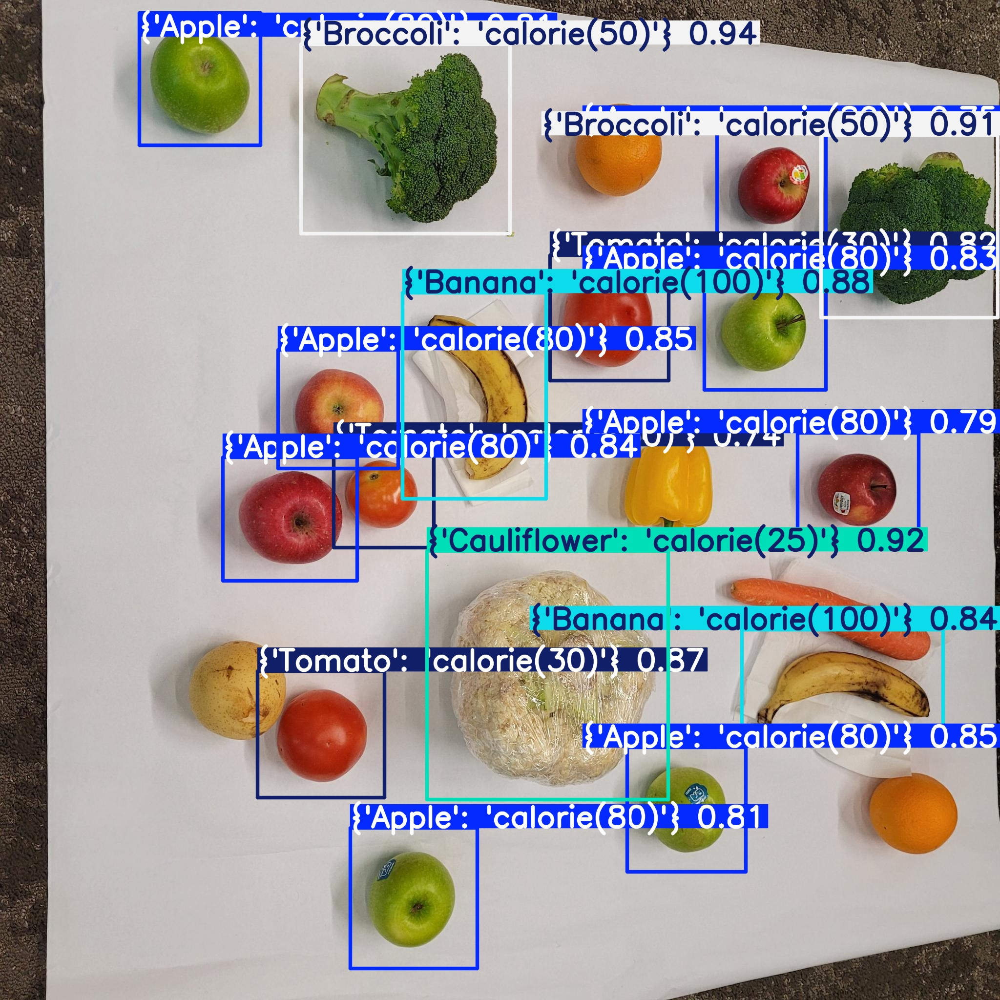

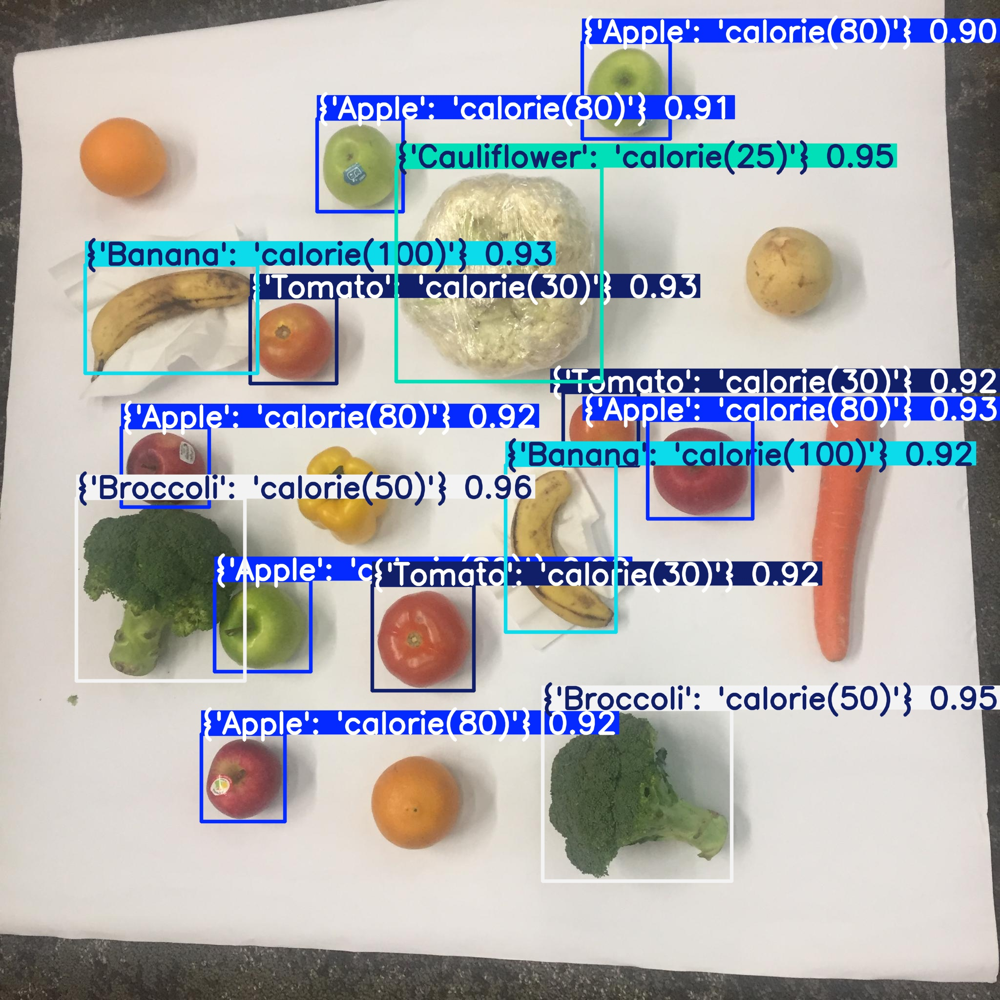

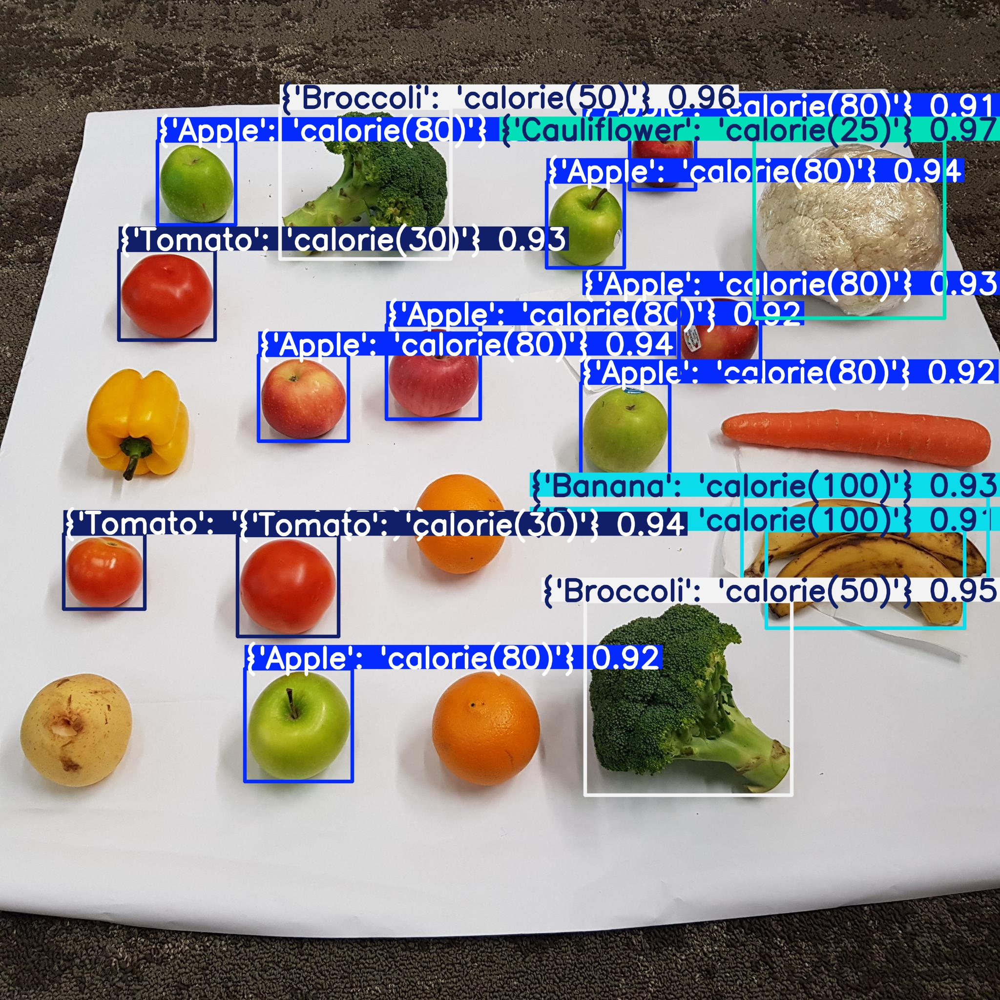

...

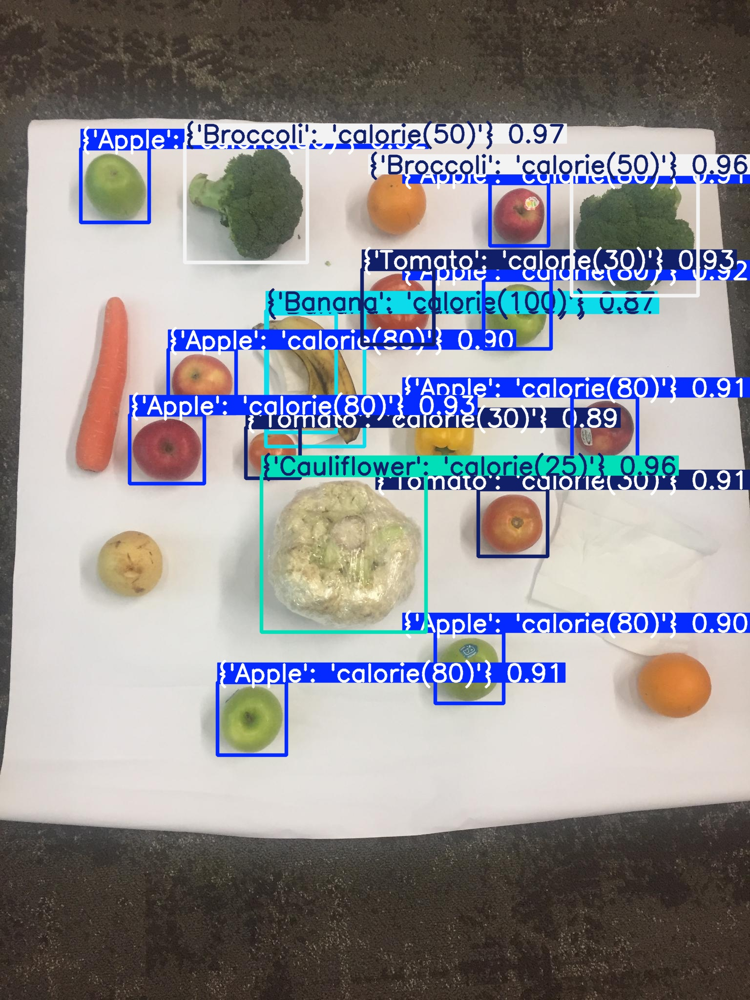

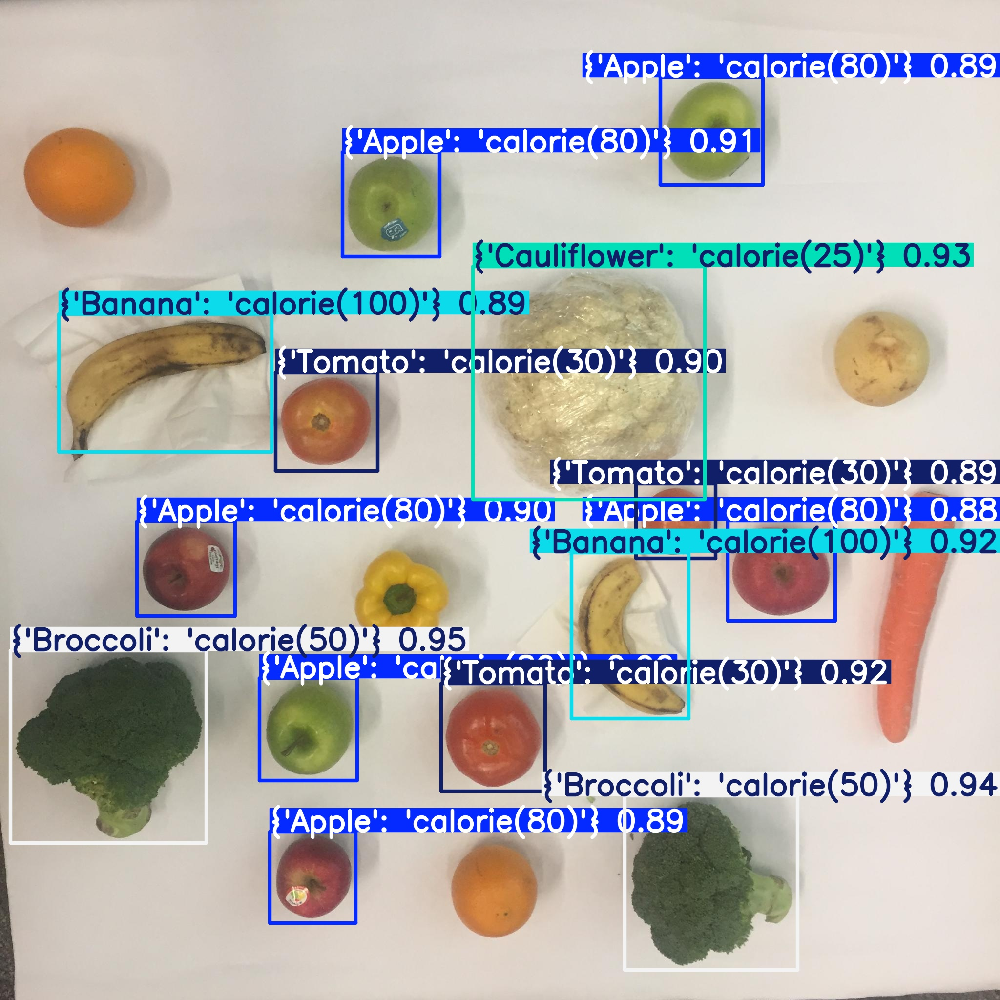

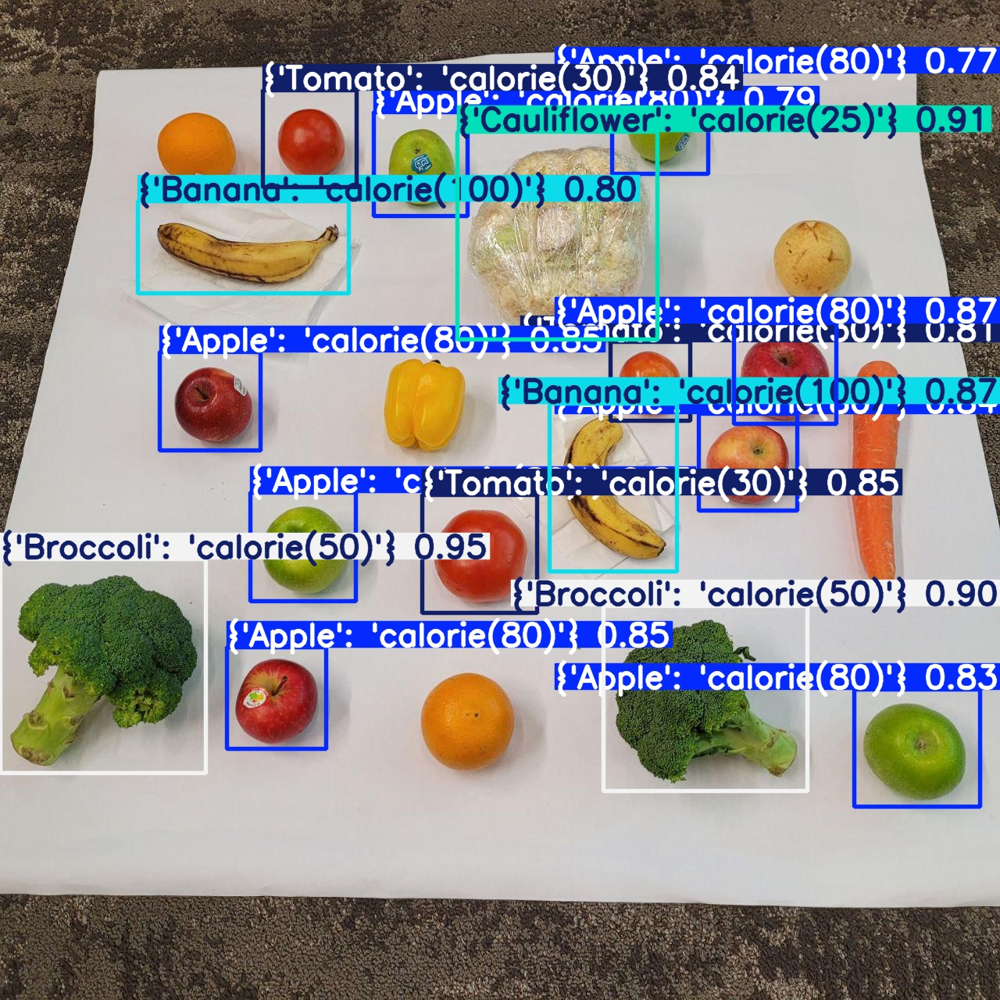

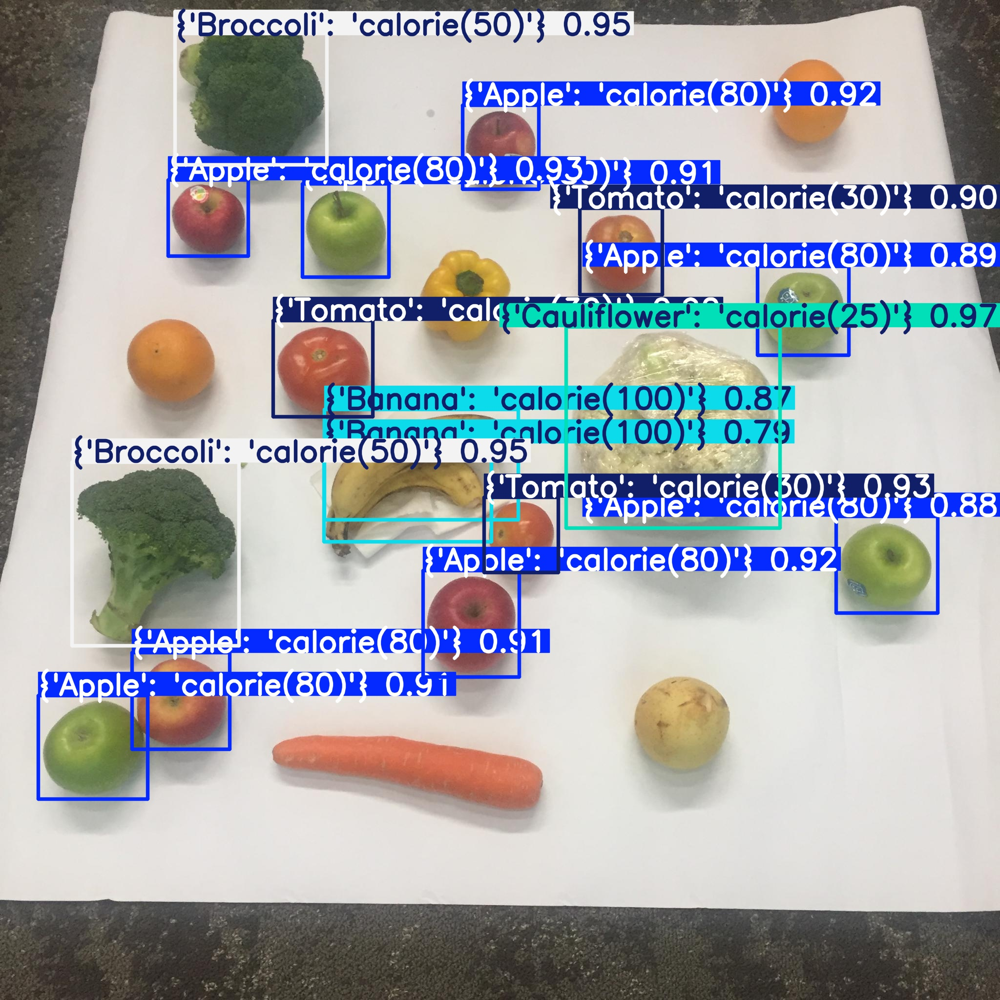

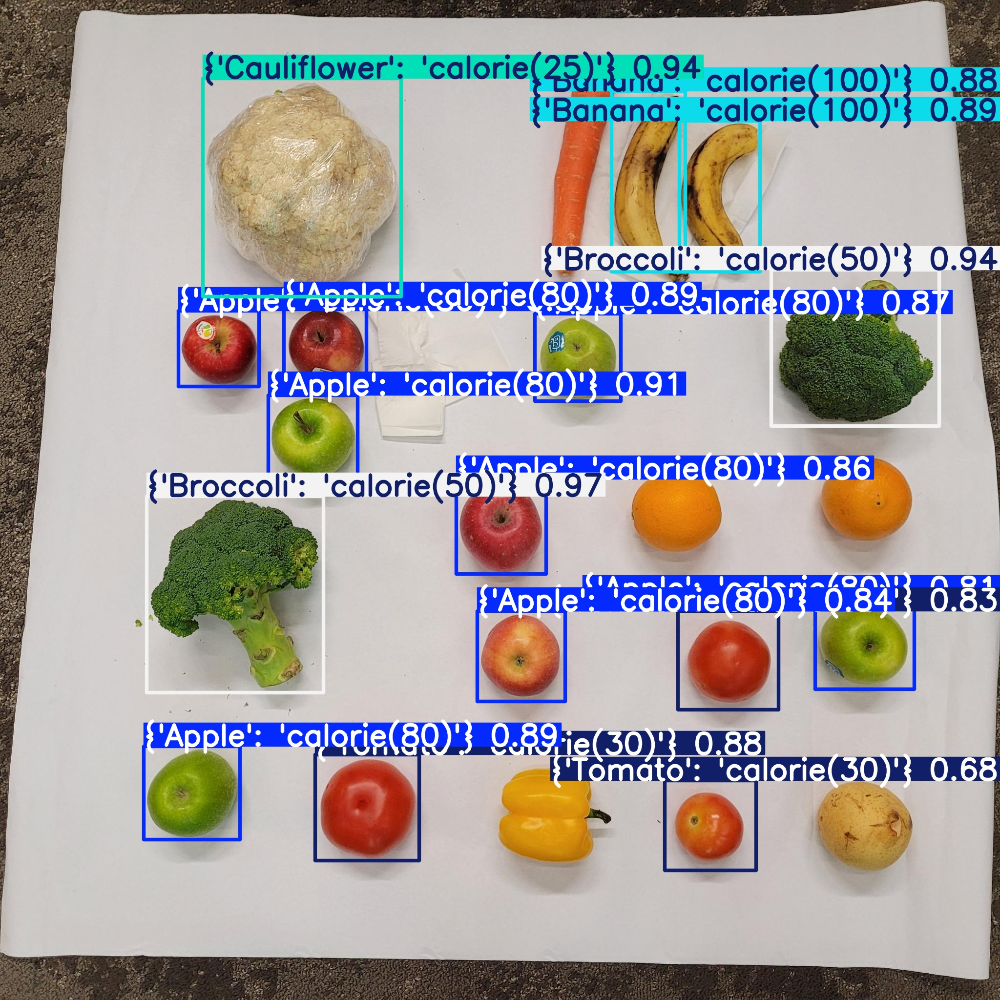

In [ ]:
import glob
from IPython.display import Image, display
for imageName in glob.glob(f'/content/runs/detect/predict/*.jpg'):
    display(Image(filename=imageName, height=600))
    print("\n")